# Analysis of flight delays for Newark Airport

Project Brief: See project documentation for full description.

Newark airport has requested an investigation into flight departure delays.<br /> 
Flight delays are a key performance indicator of airport operations. <br /> 
The following three business questions are explored:<br /> 

- What is the impact of weather on flight departure delays
- What other reasons impact flight departure delays
- How does Newark compare to other NY airports

In [1]:
# import libraries
import pandas as pd
import numpy as np
import pandas_profiling as pp
import datetime as dt
import seaborn as sns
from matplotlib import pyplot as plt
import folium

NB - may need to zip the flights csv - pandas can still read this in with the below...
df = pd.read_csv("/path/to/file.csv.zip")

In [2]:
# read in data
flights_all = pd.read_csv('../data/clean_data/flights_data.csv', index_col=0)

#create Newark only dataset
ewr_flights = flights_all.loc[(flights_all['origin'] == 'EWR')].copy().reset_index(drop=True)

# Preliminary analysis

## Investigating weather data

In [3]:
# profile report for weather variables
pp.ProfileReport(ewr_flights.loc[:, ['time_hour', 'dep_delay_true', 'wind_dir',
       'wind_speed', 'wind_gust', 'visib', 'temp_max', 'temp_min',
       'temp_ave', 'temp_departure', 'ppt', 'new_snow', 'snow_depth']])

Render HTML: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


Investigating the weather variables, `wind_speed` and `wind_gust` are highly positively correlated. As are all the temperature variables, `temp_max`, `temp_min`, `temp_ave`. <br />
Precipitation (`ppt`) has a very skewed distribution and 48% of the data is zero. The two snow variables, `new_snow` and `snow_depth` have 92% zeros in their data columns. <br />
Wind direction has a bimodal distribution. <br />
24% of the flights are delayed and 76% of the flights are not delayed.

## Investigating plane information

In [4]:
pp.ProfileReport(flights_all.loc[:,['manufacturer', 'type', 'carrier_name', 'engine', 'model']])

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  6.45it/s]



- The `type` variable is highly correlated with `manufacturer` and `engine`, remove this variable. <br />
- The `manufacturer` variable has high cardinality (lots of different categories). Recode this to the top 5 manufacturers, recode NaNs to unknown and set the rest to other.

# Variable engineering and data wrangling

Random forest is known to be a good model for flight delay data. I will prepare the data for this model.

## Variable engineering

 - convert `wind_speed` into a categorical `wind_scale` using the Beaufort scale
 - drop columns with high correlation identified in pandas profiling report (`wind_gust`, `temp_max`, `temp_min`)
 - remove `type`
 - recode `manufacturer` to the top 5 manufacturers, recode NaNs to unknown and set the rest to other
 - recode `hour`, `month` and `day` as categorical variables
 - remove other columns not thought to be important for flight delay model (keep `dest_airport`): <br />
                `dest_timezone`, `dest_alt`, `dest_lon`, `dest_lat`, `dest_faa`, `ori_timezone`, `ori_lat`, `ori_lon`, <br /> `ori_airport`, `ori_faa`, `time_hour`, `minute`, `hour`, `dest`, `tailnum`, `flight`, `carrier`, `arr_delay`, <br /> `sched_arr_time`, `arr_time`, `dep_delay`, `sched_dep_time`, `dep_time`, `day`.

Leave hour but convert to categorical add am or pm

In [5]:
# add categorical wind_scale for wind_speed
wind_labels = ['Calm', 'Light Breeze', 'Gentle Breeze', 
'Moderate Breeze', 'Fresh Breeze', 'Strong Breeze', 'Near Gale',
'Gale']

wind_bins = [0, 3, 7, 12, 18, 24, 31, 38, 46]

flights_all['wind_scale'] = pd.cut(flights_all['wind_speed'], 
bins = wind_bins, labels=wind_labels,
include_lowest = True)

In [6]:
weather_drop = ['wind_gust', 'temp_max', 'temp_min']

flights_all_trim = flights_all.drop(columns=weather_drop)

In [7]:
flights_all_trim.drop(columns=['type', 'model'], inplace = True)

man_keep = ['Unknown', 'BOEING', 'AIRBUS', 'AIRBUS INDUSTRIE',
 'EMBRAER', 'BOMBARDIER INC', 'MCDONNELL DOUGLAS AIRCRAFT CO', 'MCDONNELL DOUGLAS']

flights_all_trim.manufacturer = np.where(flights_all_trim.manufacturer.isin(man_keep),
flights_all_trim.manufacturer, 'Other')

flights_all_trim.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_faa,dest_airport,dest_lat,dest_lon,dest_alt,dest_timezone,carrier_name,manufacturer,engine,wind_scale
0,1,1,547.0,505,42.0,825.0,751,34.0,B6,1983,...,MCO,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Other,Turbo-fan,Gentle Breeze
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,MCO,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,IAD,Washington Dulles International Airport,38.944500,-77.455803,312.0,America/New_York,United Air Lines Inc.,AIRBUS INDUSTRIE,Turbo-fan,Gentle Breeze
3,1,1,1456.0,533,563.0,1757.0,843,554.0,AA,1166,...,MIA,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Gentle Breeze
4,1,1,544.0,549,-5.0,847.0,858,-11.0,AA,1399,...,MIA,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Moderate Breeze


In [8]:
#fix manufacturer doubling for airbus and mcdonnell douglas
flights_all_trim.manufacturer = flights_all_trim.manufacturer.map({
    'AIRBUS INDUSTRIE': 'AIRBUS',
    'AIRBUS': 'AIRBUS',
    'MCDONNELL DOUGLAS': 'MCDONNELL DOUGLAS',
    'MCDONNELL DOUGLAS AIRCRAFT CO': 'MCDONNELL DOUGLAS',
    'BOEING': 'BOEING',
    'EMBRAER': 'EMBRAER', 
    'BOMBARDIER INC': 'BOMBARDIER INC',
    'Unknown': 'Unknown',
    'Other': 'Other'})

flights_all_trim.head()

,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,...,dest_faa,dest_airport,dest_lat,dest_lon,dest_alt,dest_timezone,carrier_name,manufacturer,engine,wind_scale
0,1,1,547.0,505,42.0,825.0,751,34.0,B6,1983,...,MCO,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,Other,Turbo-fan,Gentle Breeze
1,1,1,545.0,545,0.0,833.0,831,2.0,B6,527,...,MCO,Orlando International Airport,28.429399,-81.308998,96.0,America/New_York,JetBlue Airways,AIRBUS,Turbo-fan,Gentle Breeze
2,1,1,556.0,555,1.0,709.0,714,-5.0,UA,320,...,IAD,Washington Dulles International Airport,38.944500,-77.455803,312.0,America/New_York,United Air Lines Inc.,AIRBUS,Turbo-fan,Gentle Breeze
3,1,1,1456.0,533,563.0,1757.0,843,554.0,AA,1166,...,MIA,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Gentle Breeze
4,1,1,544.0,549,-5.0,847.0,858,-11.0,AA,1399,...,MIA,Miami International Airport,25.793200,-80.290604,8.0,America/New_York,American Airlines Inc.,Unknown,Unknown,Moderate Breeze


In [9]:
flights_all_trim.shape

(294167, 43)

### convert timeseries data into categories

In [10]:
flights_all_trim['month_flag'] = flights_all_trim.month.astype(str)

flights_all_trim['month_flag'] = flights_all_trim['month_flag'].map({
    '1': 'Jan',
    '2': 'Feb',
    '3': 'Mar',
    '4': 'Apr',
    '5': 'May',
    '6': 'Jun', 
    '7': 'Jul',
    '8': 'Aug',
    '9': 'Sep',
    '10': 'Oct',
    '11': 'Nov',
    '12': 'Dec'})

In [11]:
flights_all_trim.loc[:, 'time_hour'] = pd.to_datetime(flights_all_trim.time_hour, yearfirst=True)

flights_all_trim['weekday'] = flights_all_trim['time_hour'].dt.day_name()

In [12]:
flights_all_trim['weekday'] = flights_all_trim['time_hour'].dt.day_name()

In [13]:
flights_all_trim['hour'] = pd.Categorical(flights_all_trim['hour'], ordered = True)

In [14]:
to_drop=['dest_timezone', 'ori_alt', 'dest_lon', 'dest_lat', 'dest_faa', 
'ori_timezone', 'ori_lat', 'ori_lon', 'ori_airport', 'ori_faa', 'time_hour', 
'minute', 'dest', 'tailnum', 'flight', 'carrier', 'arr_delay', 'sched_arr_time', 
'arr_time', 'dep_delay', 'month', 'sched_dep_time','dep_time', 'day']

flights_model_data = flights_all_trim.drop(columns=to_drop)

Remove data for EWR (Newark) - save the rest of the data for future work, can run the model on the data for the other airports to see how it performs

In [15]:
# split into EWR, and the others
ewr_model_data = flights_model_data.loc[(flights_model_data['origin'] == 'EWR')].copy()

# Exploratory Data Analysis

In [16]:
# set figure sizes for all plots
plt.rcParams['figure.figsize'] = [5, 3]
plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 10

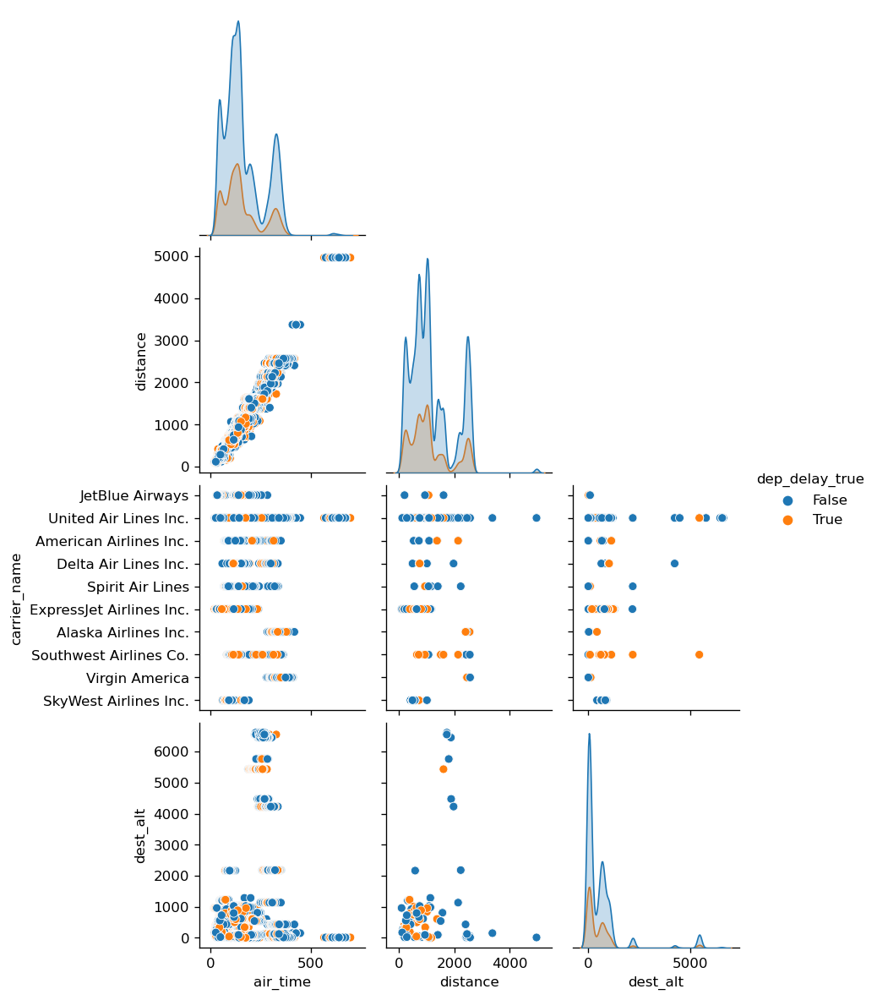

In [17]:
sns.pairplot(ewr_model_data,
x_vars=['air_time', 'distance', 'dest_alt'],
y_vars=['air_time', 'distance', 'carrier_name', 'dest_alt'],
hue = 'dep_delay_true',
corner = True)

In [18]:
ewr_all = flights_all_trim.loc[(flights_all_trim['origin'] == 'EWR')].copy().reset_index(drop = True)

In [19]:
# function to create a column with percentage of delayed flights per grouping column (col)
def percent_delay(col):
    ewr_all.loc[:, 'dep_delay_per_'+ col] = ewr_all.groupby([col]).dep_delay_true.transform('sum')
    ewr_all.loc[:, 'total_flights_per_' + col] = ewr_all.groupby([col]).dep_delay.transform('count')
    ewr_all.loc[:, 'percent_delay_per_' + col] = (ewr_all['dep_delay_per_'+ col] / ewr_all['total_flights_per_' + col]) * 100

## EDA weather and flight delays

In [20]:
# set custom graph options

line_pal = sns.color_palette(['#f9ab00', '#49006a'])

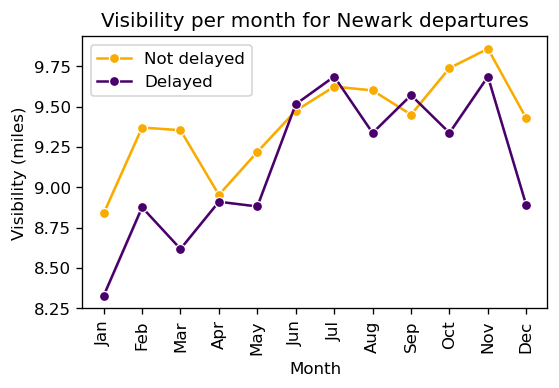

In [36]:
visib_plot = sns.lineplot(
    x = 'month_flag',
    y = 'visib',
    hue = 'dep_delay_true',
    marker = 'o',
    ci = False,
    palette = line_pal,
    data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Visibility (miles)')
plt.title('Visibility per month for Newark departures')
plt.legend(title='', labels=['Not delayed', 'Delayed']);

fig.savefig('path/to/save/image/to.png')

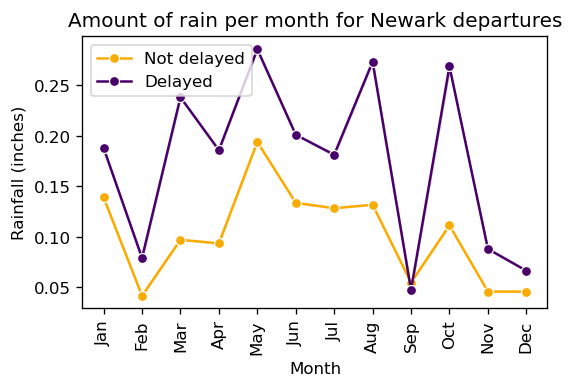

In [37]:
sns.lineplot(x = 'month_flag',
y = 'ppt',
hue = 'dep_delay_true',
marker='o',
palette = line_pal,
ci=False,
data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Rainfall (inches)')
plt.title('Amount of rain per month for Newark departures')
plt.legend(title='', labels=['Not delayed', 'Delayed']);

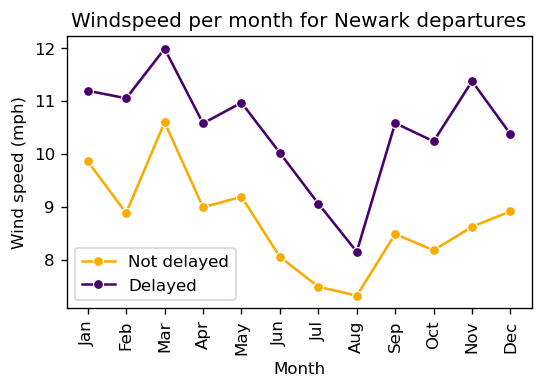

In [23]:
sns.lineplot(x = 'month_flag',
y = 'wind_speed',
hue = 'dep_delay_true',
marker='o',
palette = line_pal,
ci = False,
data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Wind speed (mph)')
plt.title('Windspeed per month for Newark departures')
plt.legend(title='', labels=['Not delayed', 'Delayed']);

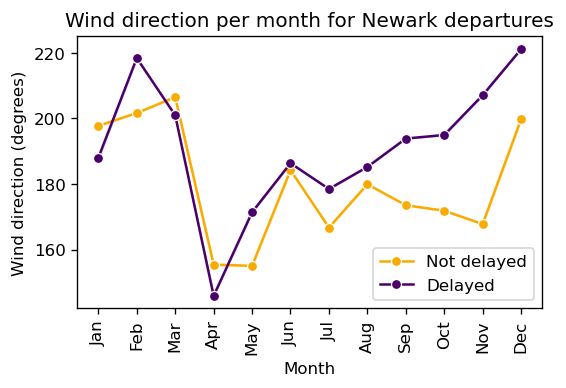

In [35]:
sns.lineplot(x = 'month_flag',
y = 'wind_dir',
hue = 'dep_delay_true',
marker='o',
palette = line_pal,
ci = False,
data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Wind direction (degrees)')
plt.title('Wind direction per month for Newark departures')
plt.legend(title='', labels=['Not delayed', 'Delayed']);


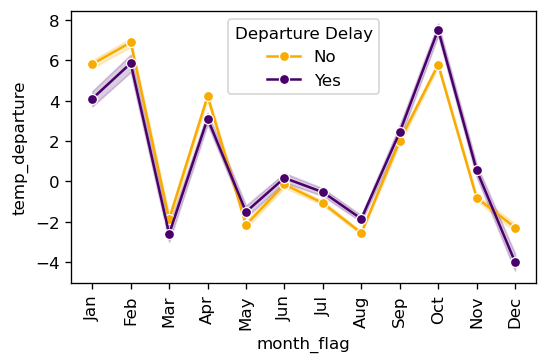

In [26]:
sns.lineplot(x = 'month_flag',
y = 'temp_departure',
hue = 'dep_delay_true',
marker='o',
palette = line_pal,
data = ewr_all)
plt.xticks(rotation=90)
plt.legend(title='Departure Delay', labels=['No', 'Yes']);

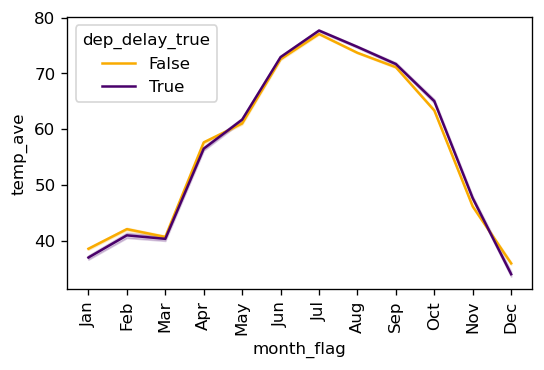

In [27]:
sns.lineplot(x = 'month_flag',
y = 'temp_ave',
hue = 'dep_delay_true',
palette = line_pal,
data = ewr_all)
plt.xticks(rotation=90);

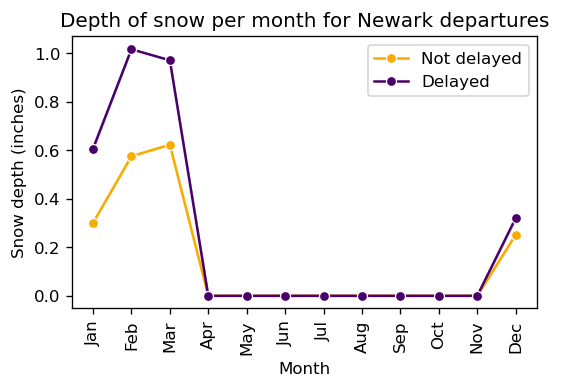

In [33]:
sns.lineplot(x = 'month_flag',
y = 'snow_depth',
marker='o',
hue = 'dep_delay_true',
palette = line_pal,
ci = False,
data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Snow depth (inches)')
plt.title('Depth of snow per month for Newark departures')
plt.legend(title='', labels=['Not delayed', 'Delayed']);

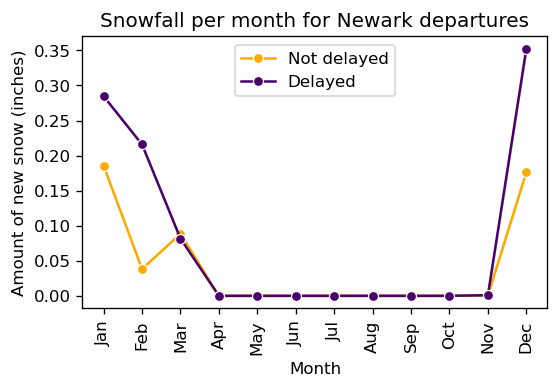

In [32]:
sns.lineplot(x = 'month_flag',
y = 'new_snow',
hue = 'dep_delay_true',
marker='o',
palette = line_pal,
ci = False,
data = ewr_all)
plt.xticks(rotation=90)
plt.xlabel('Month')
plt.ylabel('Amount of new snow (inches)')
plt.title('Snowfall per month for Newark departures')
plt.legend(title='', labels=['Not delayed', 'Delayed']);

For presentation, select graphs which show differences in flight delays over different months.

## EDA for other reasons for delays

### Carrier delays

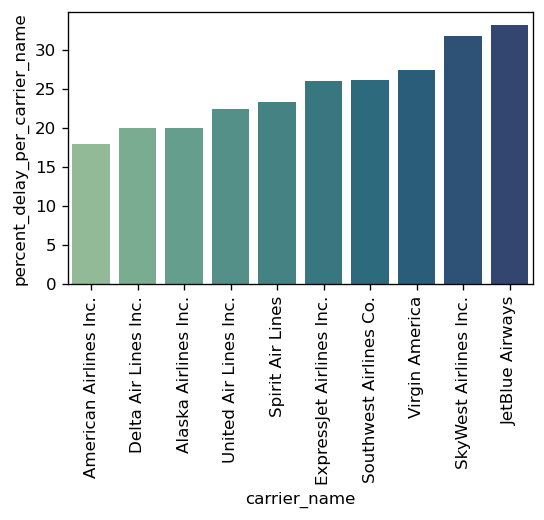

In [30]:
percent_delay('carrier_name')
carrier = ewr_all.drop_duplicates(subset=['carrier_name']).reset_index(drop = True)

ordered_data = carrier.sort_values('percent_delay_per_carrier_name').carrier_name

sns.barplot(x = 'carrier_name',
y = 'percent_delay_per_carrier_name',
palette = 'crest',
order = ordered_data,
data = carrier)
plt.xticks(rotation=90);